notebook creates performance plots (reward walks and choices) of a single agent

In [1]:
import os
#move up in directory
os.chdir('../')
#os.getcwd()

In [2]:
os.getcwd()

'C:\\Users\\deniz\\Desktop\\PhD\\p1_generalization'

In [3]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams.update({'font.size': 20})
plt.rcParams["figure.figsize"] = (7, 7)

In [4]:
def plot_performance(df, title , my_cols = ['tab:blue','tab:orange','tab:green','tab:purple']):
    
    # get reward_probability 
    p_rews_cols = [word for word in df.columns if word.startswith('p_rew')] 
    p_rews = df[p_rews_cols]
    p_rews = p_rews * 100

    # prepare actions array
    ch_cols = [word for word in df.columns if word.startswith('choice')] 
    my_choices = df[ch_cols]
    
    # show dots for actions in the following y-positions
    x=[100, 101.5, 103, 104.5]
    actions = [x[i] for i in df.choice.values]

    # maybe use this instead of above 
    # df[['choice']]

    # get accuracy
    accuracy = [int(ch==np.argmax([p1,p2,p3,p4])) for ch, p1, p2, p3, p4 in zip(df['choice'], df['p_rew_1'], df['p_rew_2'], df['p_rew_3'], df['p_rew_4'])]
    accuracy = '{} % Optimal'.format(str(int(100*round(np.mean(accuracy), 2))))

    # get proportion of switches
    is_switch = [int(df['choice'].values[t] != df['choice'].values[t-1]) for t in range(1, len(df.choice))]
    prop_switches = np.round(np.sum(is_switch)/len(is_switch),2)
    prop_switches = '{} % Switch'.format(int(100*prop_switches))

    # plot
    for i, col in enumerate(my_cols):
        plt.plot(range(300), p_rews.iloc[:,i], color=col, linewidth = 2)

    # add legend
    plt.legend(['b1', 'b2', 'b3', 'b4'], frameon = False, prop={'size': 15})

    # create color for actions
    tmp_col = []

    for col in range(my_choices['choice'].shape[0]):
        tmp_col.append(my_cols[int(my_choices['choice'].iloc[col])])

    plt.scatter(range(len(actions)), actions, c = tmp_col, s =10)

    # labels
    plt.xlabel('Trial')
    plt.ylabel('Reward')

    # main title
    plt.title(title + '\n'+ accuracy + ', ' +  prop_switches, size = 20)
    
    plt.tight_layout()
    
    plt.savefig('../p1_generalization/plots/perf_plot_{}.svg'.format(title), dpi = 600)
    
    plt.show()

# Human

C:\Users\deniz\AppData\Local\anaconda3\envs\rnn\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Users\deniz\AppData\Local\anaconda3\envs\rnn\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


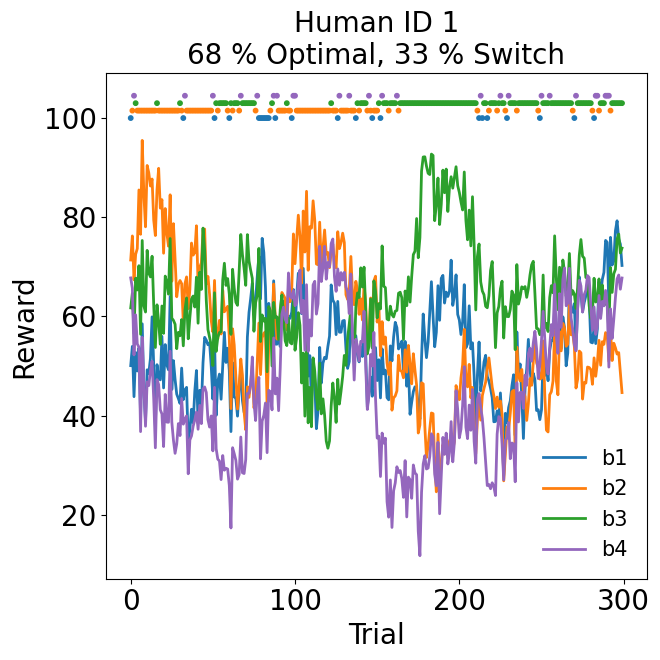

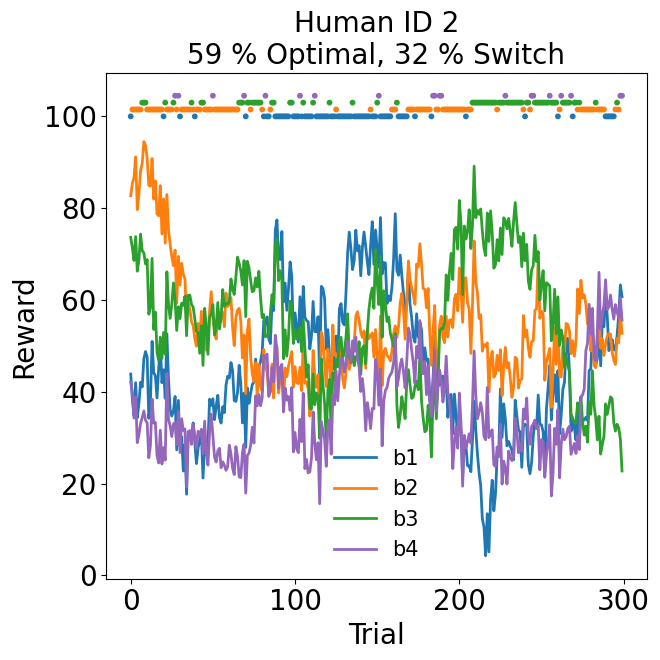

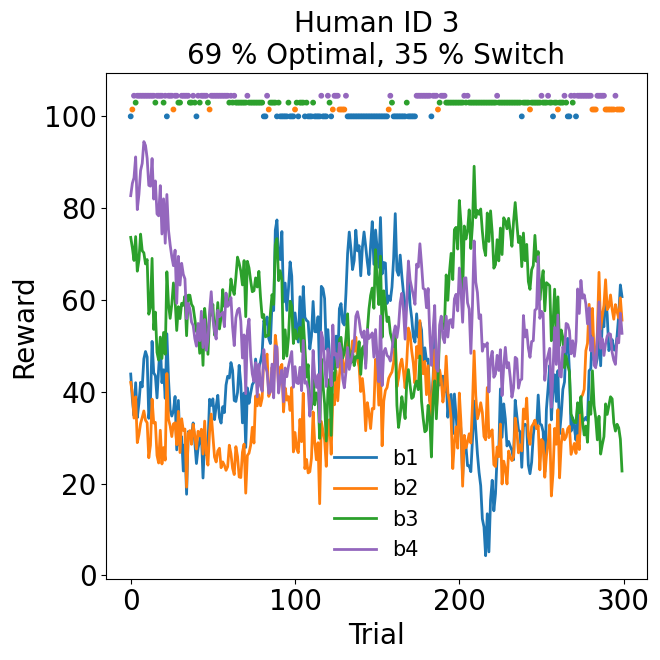

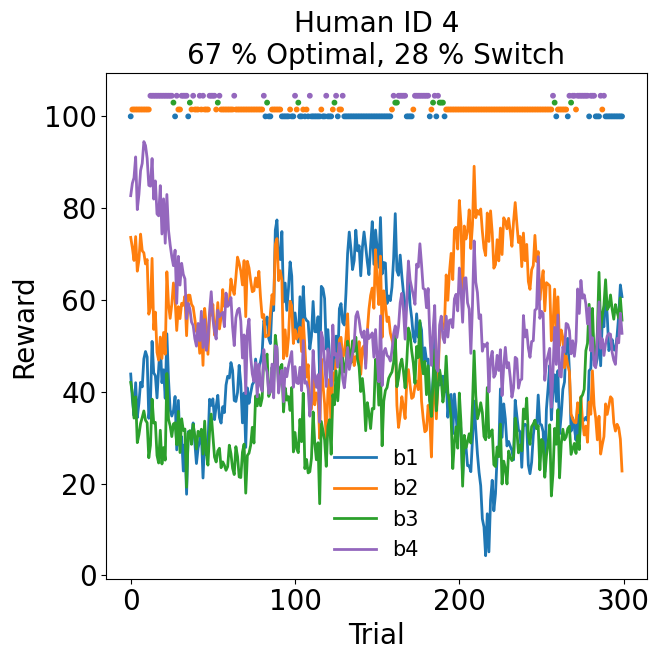

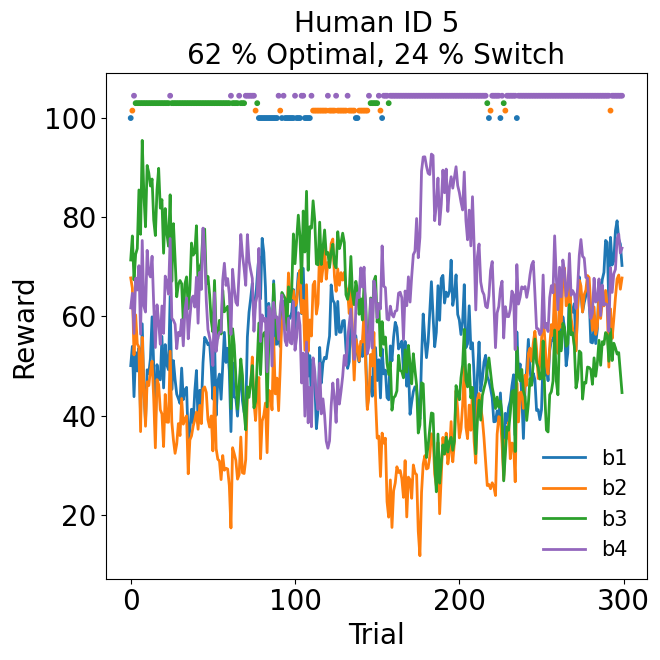

...

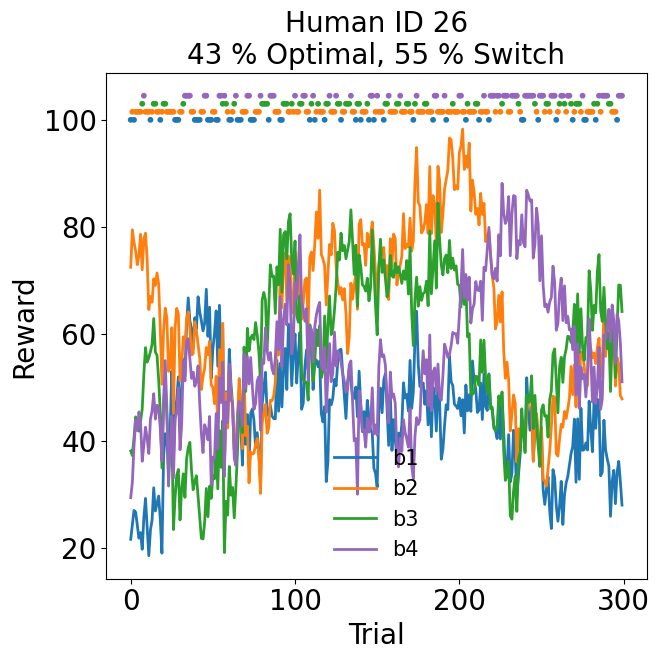

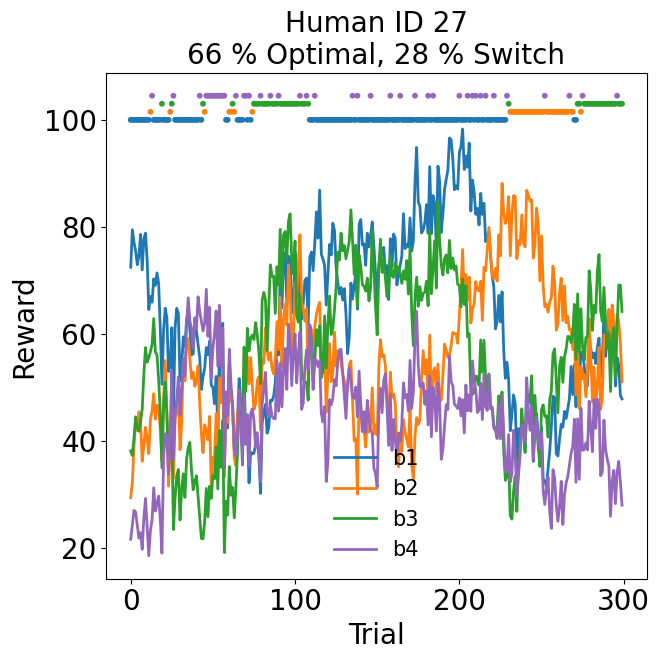

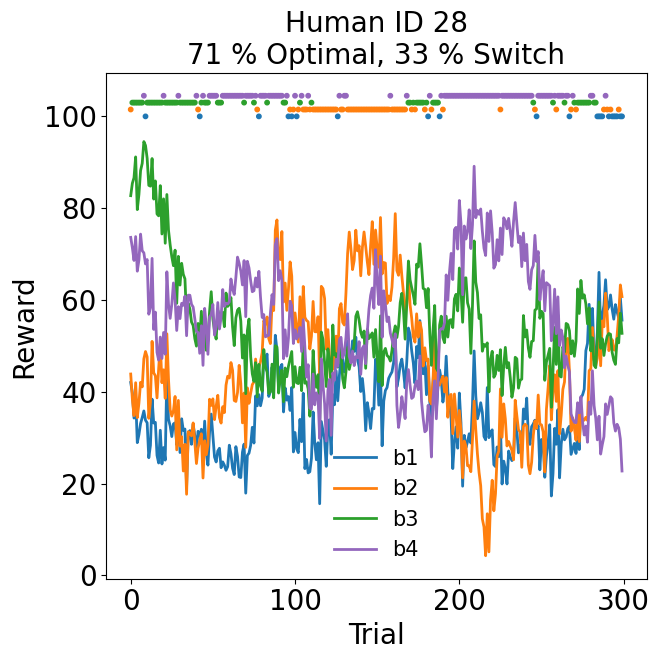

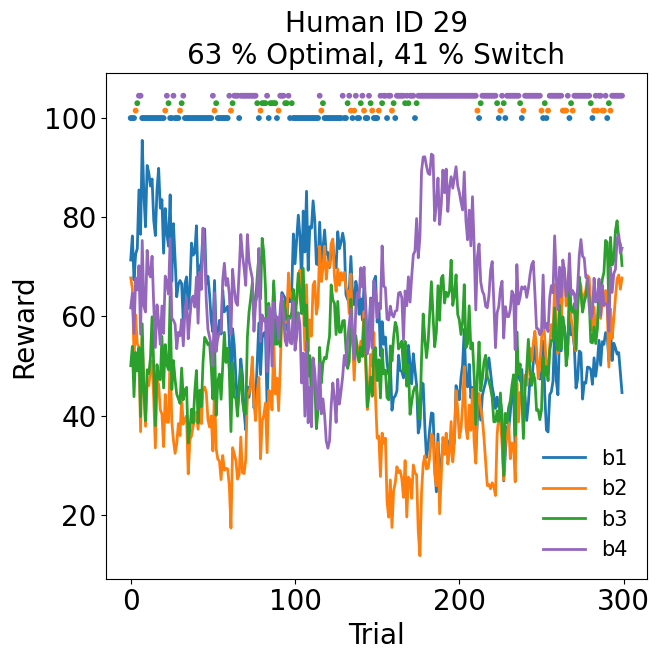

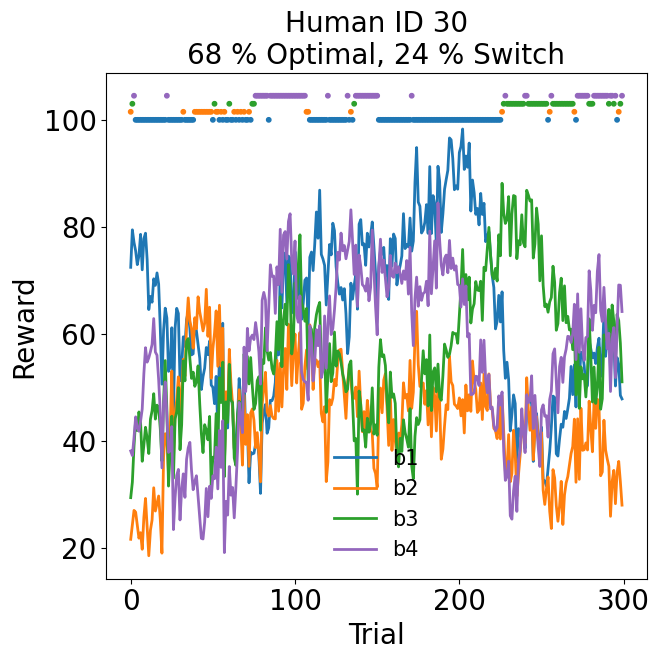

In [8]:
path_to_data = 'data/human_raw_data/'
data_file = 'data_chakroun_wiehler.csv'
human_df = pd.read_csv(open(path_to_data + data_file, 'rb'), index_col=0)

for sub in range(1,31):
    
    temp_df = human_df[human_df['vp'].values==sub]
    # change human data to get function to work
    temp_df.columns = ['study', 'vp', 'p_rew_1', 'p_rew_2', 'p_rew_3', 'p_rew_4', 'choice', 'rt']
    temp_df['choice'] = temp_df['choice'].values - 1
    temp_df[['p_rew_1', 'p_rew_2', 'p_rew_3', 'p_rew_4']] = temp_df[['p_rew_1', 'p_rew_2', 'p_rew_3', 'p_rew_4']].values/100

    plot_performance(temp_df, 'Human ID {}'.format(sub))

# RNN

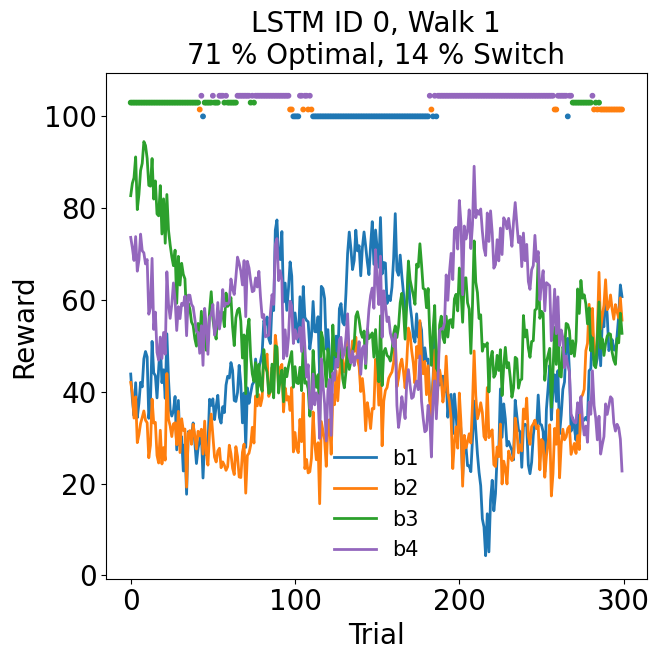

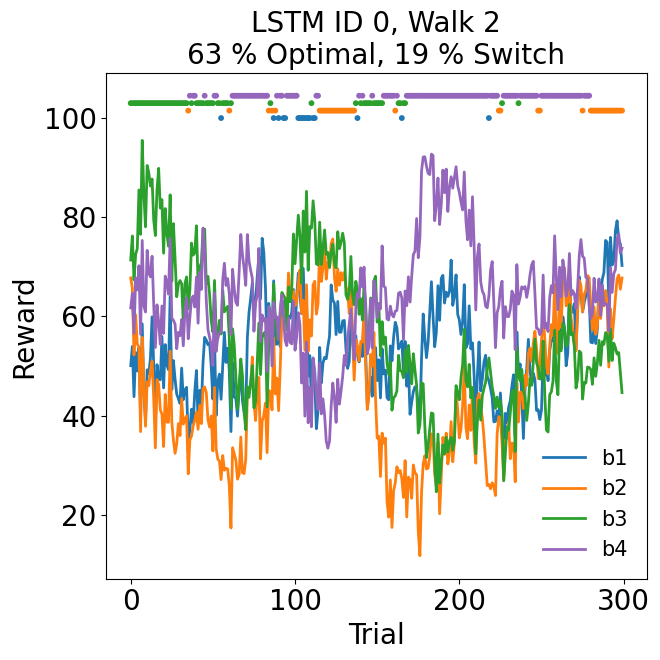

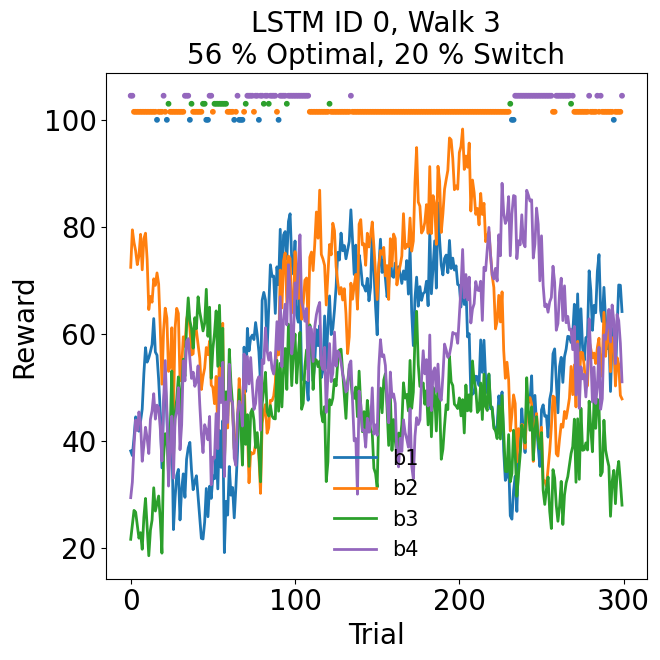

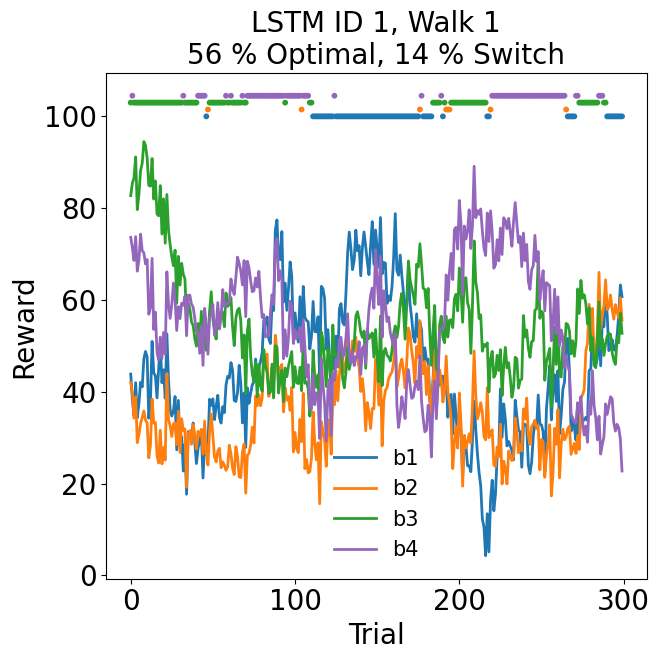

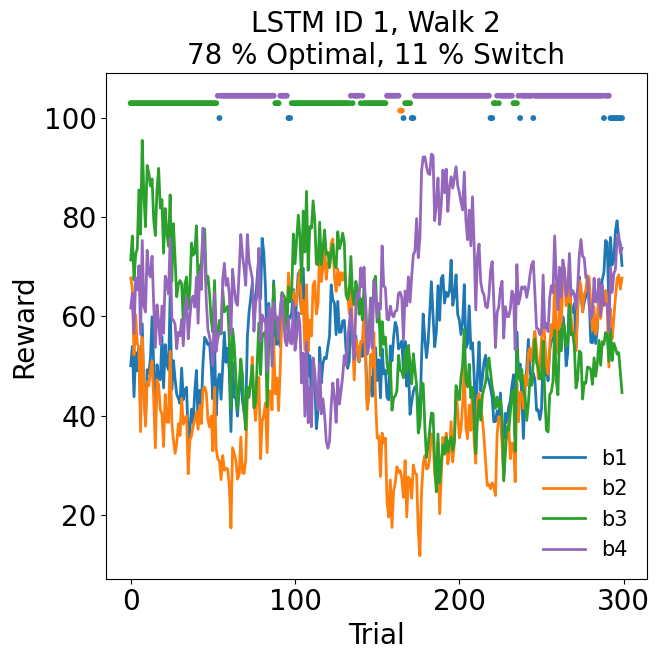

...

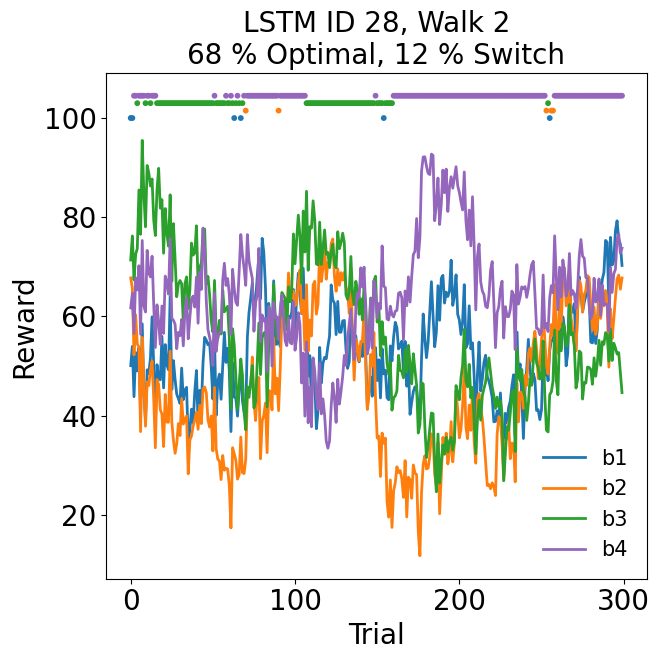

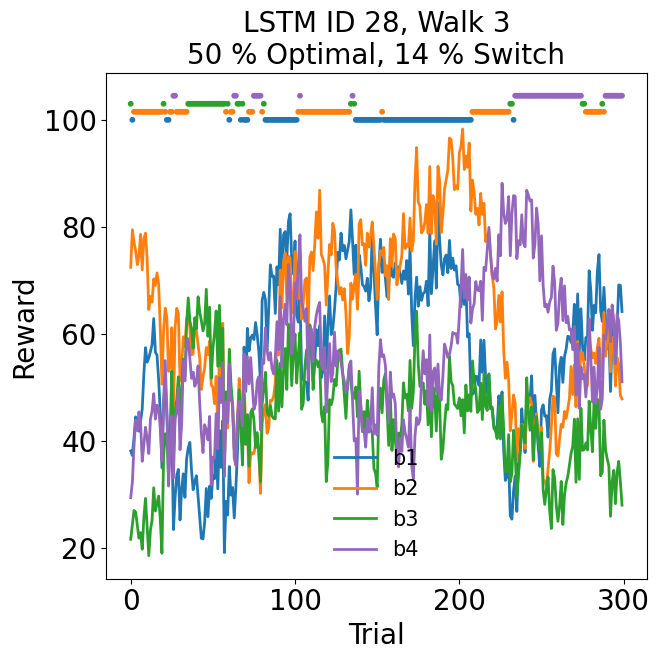

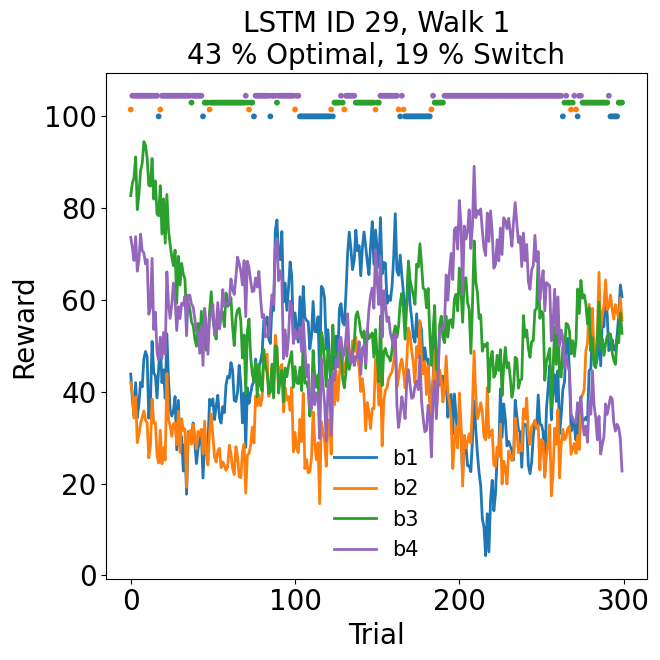

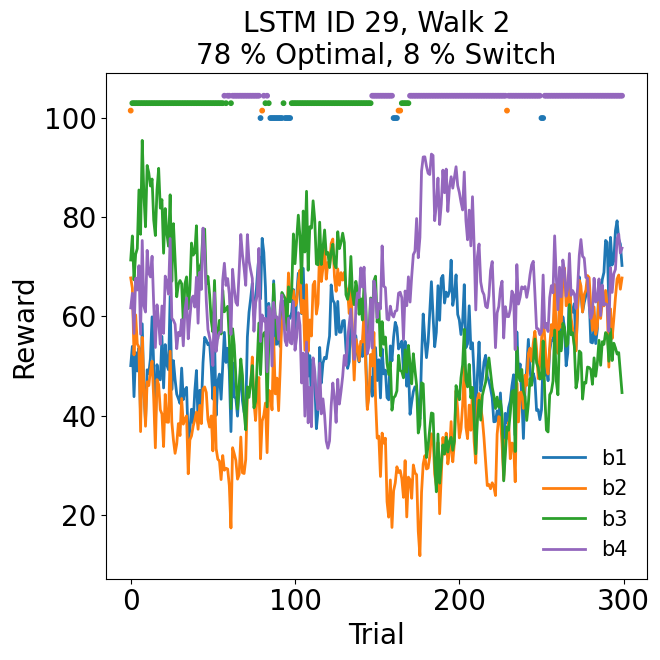

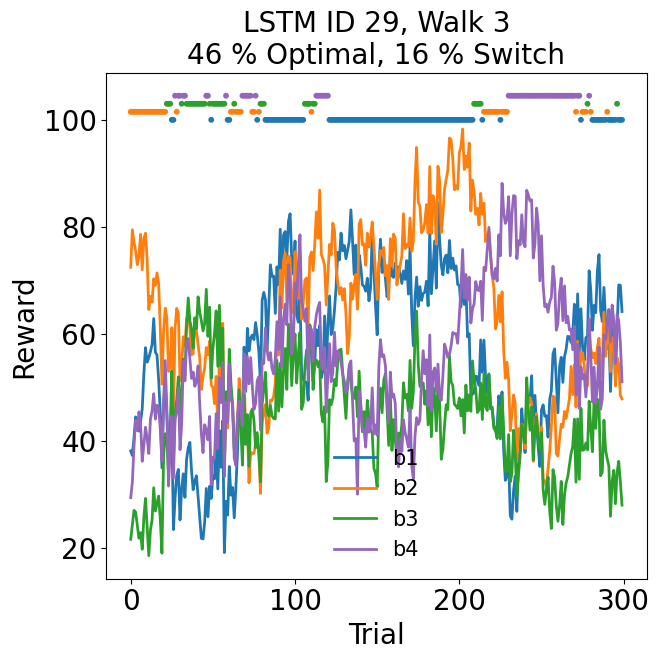

In [10]:
file_path = 'data/rnn_raw_data/lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}' 

for id_ in range(0,30):
        for walk in range(1,4):
            
            d = pickle.load(open(file_path.format(id_, walk), 'rb'))
            df = d.reset_index()
            plot_performance(df, 'LSTM ID {}, Walk {}'.format(id_, walk))

# Raincloud Plots Switching

In [127]:
import pandas as pd
import seaborn as sns
import os
import matplotlib.pyplot as plt
sns.set(style="whitegrid",font_scale=2)
import matplotlib.collections as clt
import ptitprince as pt


In [130]:
# get human switch proportions
human_switch_props = []

for sub in range(1,32):
    
    temp_df = human_df[human_df['vp'].values==sub]
    is_switch = [int(temp_df['choice'].values[t] != temp_df['choice'].values[t-1]) for t in range(1, len(temp_df.choice))]
    human_switch_props.append(np.mean(is_switch))


# get LSTM switch proportions
file_path = 'data/rnn_raw_data/lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}' 

lstm_switch_props = []

for id_ in range(20):
        for walk in range(1,4):
            
            d = pickle.load(open(file_path.format(id_, walk), 'rb'))
            df = d.reset_index()
            
            lstm_switch_props.append(np.mean(df['is_switch']))

In [30]:
plot_df = pd.DataFrame({"switch": lstm_switch_props + human_switch_props,
                       "type": ['LSTM'] * len(lstm_switch_props)  + ['Human'] * len(human_switch_props)})

NameError: name 'lstm_switch_props' is not defined

Text(0.5, 0, '')

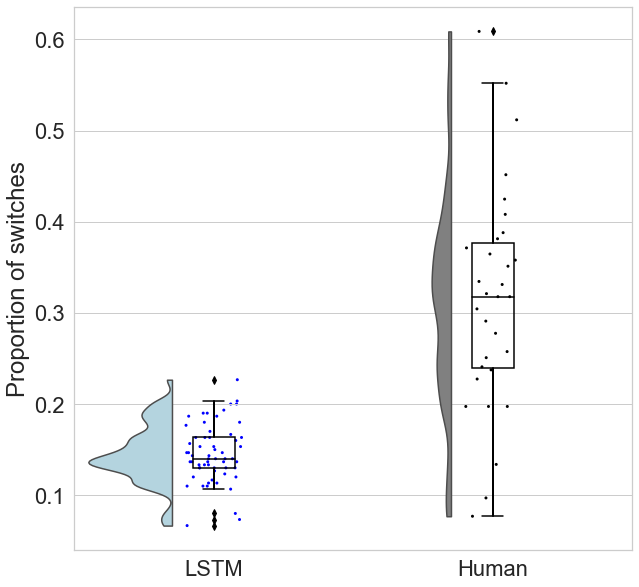

In [160]:
# plotting the clouds
f, ax = plt.subplots(figsize=(10, 10))
dy="switch"; dx="type"; ort="v"; pal = {"LSTM": "lightblue", "Human": "grey"}#sns.color_palette(n_colors=2)
ax=pt.half_violinplot( x = dx, y = dy, data = plot_df, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)


pal1 = {"LSTM": "blue", "Human": "black"}
ax=sns.stripplot( x = dx, y = dy, data = plot_df, palette = pal1, edgecolor = "white",
size = 3, jitter = 1, zorder = 0, orient = ort)

x=sns.boxplot( x = dx, y = dy, data = plot_df, color = "black", width = .15, zorder = 10,\
showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
saturation = 1, orient = ort)

plt.ylabel('Proportion of switches')
plt.xlabel('')

['LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'LSTM',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human',
 'Human']